In [1]:
import pandas as pd
from config.paths import get_project_root_path


DATASET_NAMES = ["les_miserables", "1138_bus", "USpowerGrid"]
PARAMS_NAMES = ["number_of_pivots", "number_of_iterations", "eps"]
EXPERIENT_DATA_DIR = (
    get_project_root_path()
    .joinpath("data")
    .joinpath("experiments")
    .joinpath("regression_analysis")
)

data_df_dict = {}
for dataset_name in DATASET_NAMES:
    data_path = EXPERIENT_DATA_DIR.joinpath("grid").joinpath(
        f"{dataset_name}-without-pos.pkl"
    )
    df = pd.read_pickle(data_path)
    data_df_dict[dataset_name] = pd.read_pickle(data_path)


In [2]:
from config.quality_metrics import ALL_QM_NAMES


x = {}
y = {}
for dataset_name in DATASET_NAMES:
    x[dataset_name] = {}
    y[dataset_name] = {}

for dataset_name in DATASET_NAMES:
    for params_name in PARAMS_NAMES:
        x[dataset_name][params_name] = data_df_dict[dataset_name][[params_name]]
        y[dataset_name][params_name] = data_df_dict[dataset_name][ALL_QM_NAMES]


In [3]:
from config.parameters import domain_ss

params_steps = {
    "number_of_pivots": 5,
    "number_of_iterations": 10,
    "eps": 0.05,
}

params_candidates = {}
params_names = ["number_of_pivots", "number_of_iterations", "eps"]
for params_name in params_names:
    lower = domain_ss[params_name]["l"]
    upper = domain_ss[params_name]["u"]

    params_candidates[params_name] = [
        v * params_steps[params_name] for v in list(range(1, 20 + 1))
    ]

angular_resolution ['number_of_iterations', 'eps']
[(10, 0.05), (10, 0.1), (10, 0.15000000000000002), (10, 0.2), (10, 0.25), (10, 0.30000000000000004), (10, 0.35000000000000003), (10, 0.4), (10, 0.45), (10, 0.5), (10, 0.55), (10, 0.6000000000000001), (10, 0.65), (10, 0.7000000000000001), (10, 0.75), (10, 0.8), (10, 0.8500000000000001), (10, 0.9), (10, 0.9500000000000001), (10, 1.0), (20, 0.05), (20, 0.1), (20, 0.15000000000000002), (20, 0.2), (20, 0.25), (20, 0.30000000000000004), (20, 0.35000000000000003), (20, 0.4), (20, 0.45), (20, 0.5), (20, 0.55), (20, 0.6000000000000001), (20, 0.65), (20, 0.7000000000000001), (20, 0.75), (20, 0.8), (20, 0.8500000000000001), (20, 0.9), (20, 0.9500000000000001), (20, 1.0), (30, 0.05), (30, 0.1), (30, 0.15000000000000002), (30, 0.2), (30, 0.25), (30, 0.30000000000000004), (30, 0.35000000000000003), (30, 0.4), (30, 0.45), (30, 0.5), (30, 0.55), (30, 0.6000000000000001), (30, 0.65), (30, 0.7000000000000001), (30, 0.75), (30, 0.8), (30, 0.8500000000000

/var/folders/23/db_nbhl55hvds1mt0zx_p14h0000gn/T/ipykernel_32219/3880103729.py:23: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axis = plt.subplots(1, 1, figsize=(8, 8))


crossing_number ['number_of_pivots', 'number_of_iterations']
[(5, 10), (5, 20), (5, 30), (5, 40), (5, 50), (5, 60), (5, 70), (5, 80), (5, 90), (5, 100), (5, 110), (5, 120), (5, 130), (5, 140), (5, 150), (5, 160), (5, 170), (5, 180), (5, 190), (5, 200), (10, 10), (10, 20), (10, 30), (10, 40), (10, 50), (10, 60), (10, 70), (10, 80), (10, 90), (10, 100), (10, 110), (10, 120), (10, 130), (10, 140), (10, 150), (10, 160), (10, 170), (10, 180), (10, 190), (10, 200), (15, 10), (15, 20), (15, 30), (15, 40), (15, 50), (15, 60), (15, 70), (15, 80), (15, 90), (15, 100), (15, 110), (15, 120), (15, 130), (15, 140), (15, 150), (15, 160), (15, 170), (15, 180), (15, 190), (15, 200), (20, 10), (20, 20), (20, 30), (20, 40), (20, 50), (20, 60), (20, 70), (20, 80), (20, 90), (20, 100), (20, 110), (20, 120), (20, 130), (20, 140), (20, 150), (20, 160), (20, 170), (20, 180), (20, 190), (20, 200), (25, 10), (25, 20), (25, 30), (25, 40), (25, 50), (25, 60), (25, 70), (25, 80), (25, 90), (25, 100), (25, 110), (2

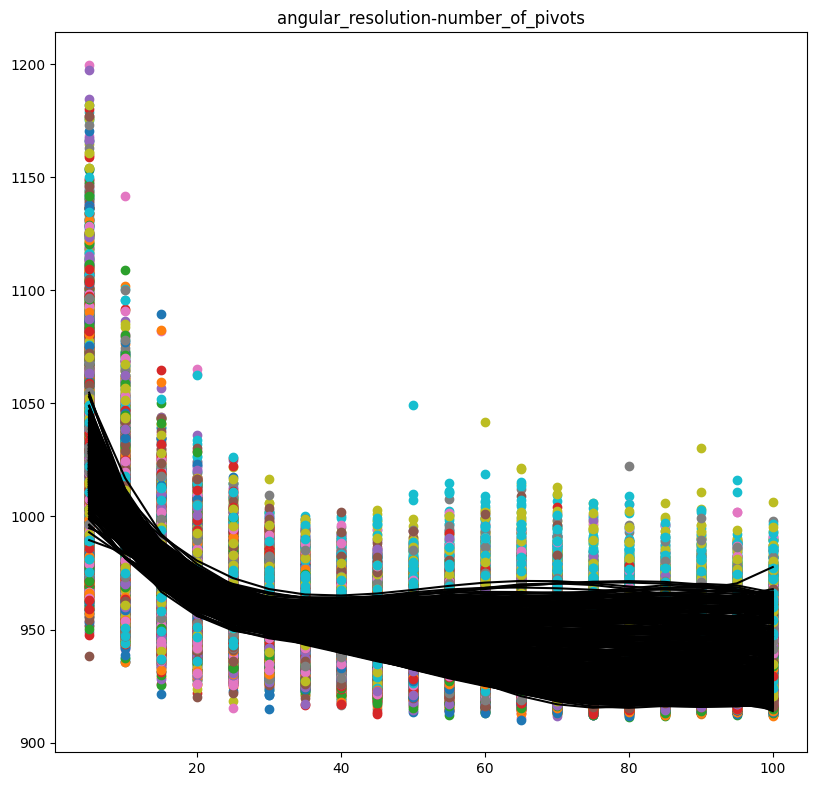

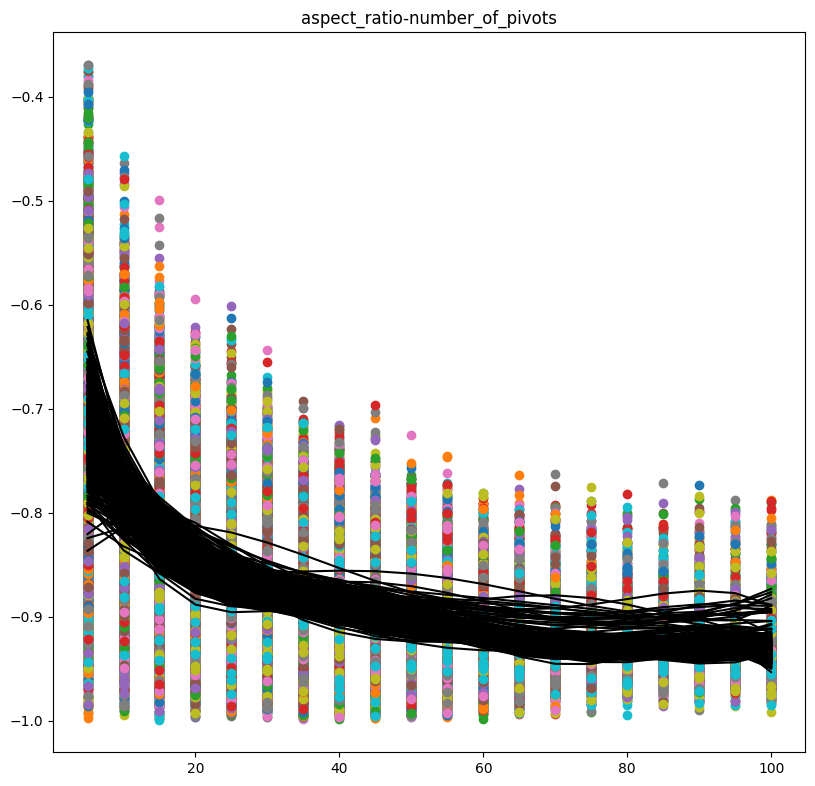

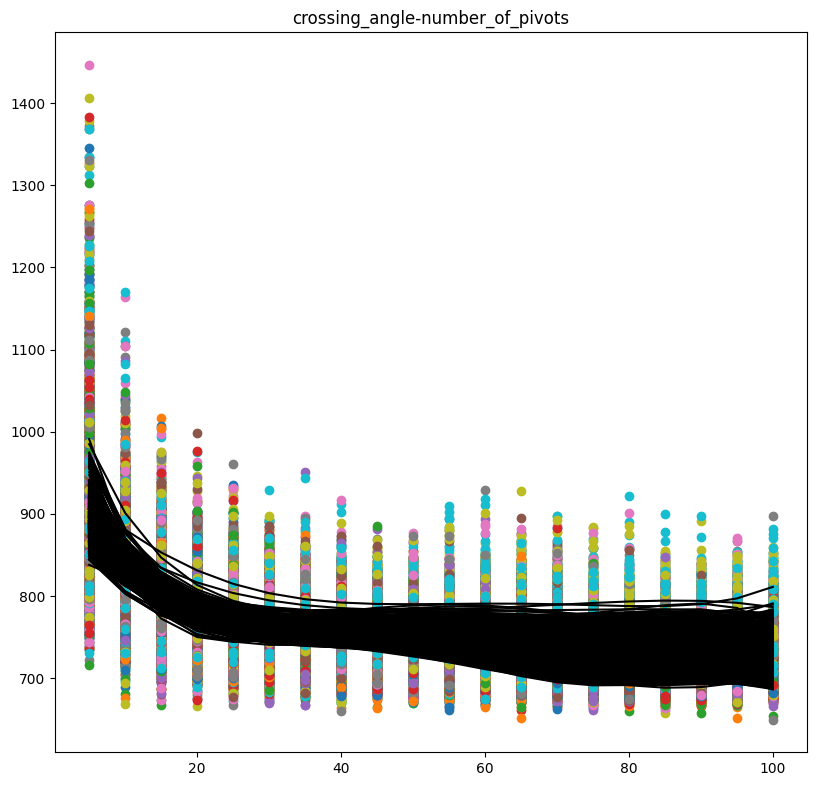

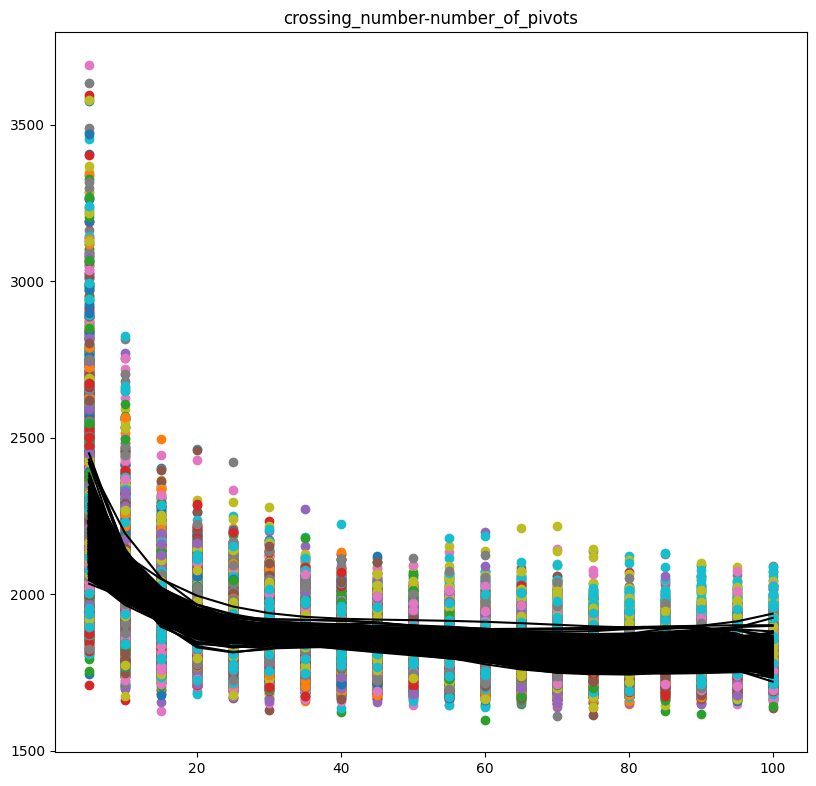

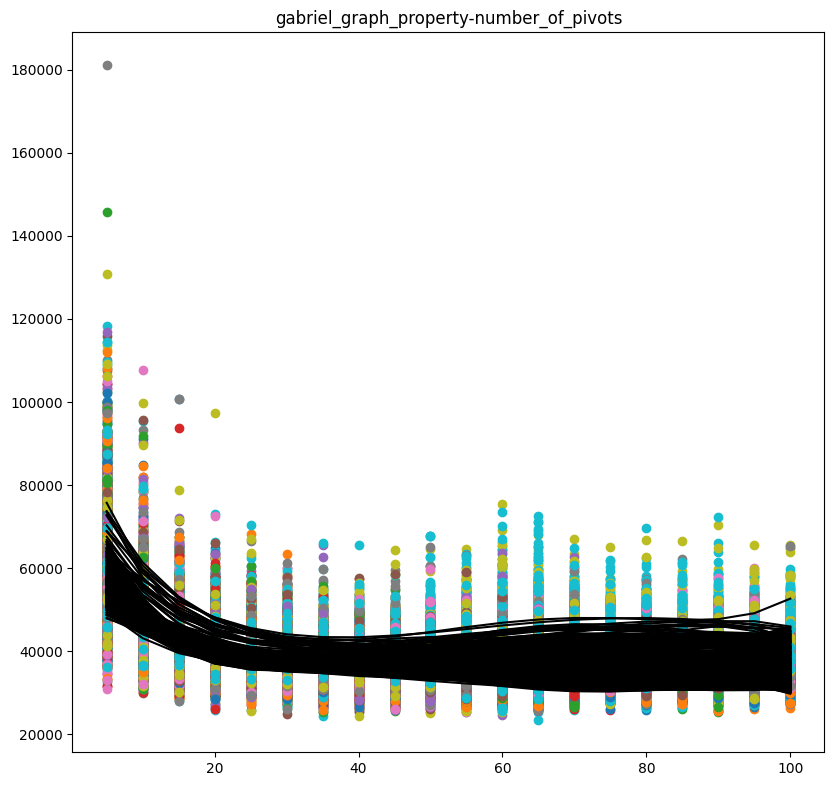

...

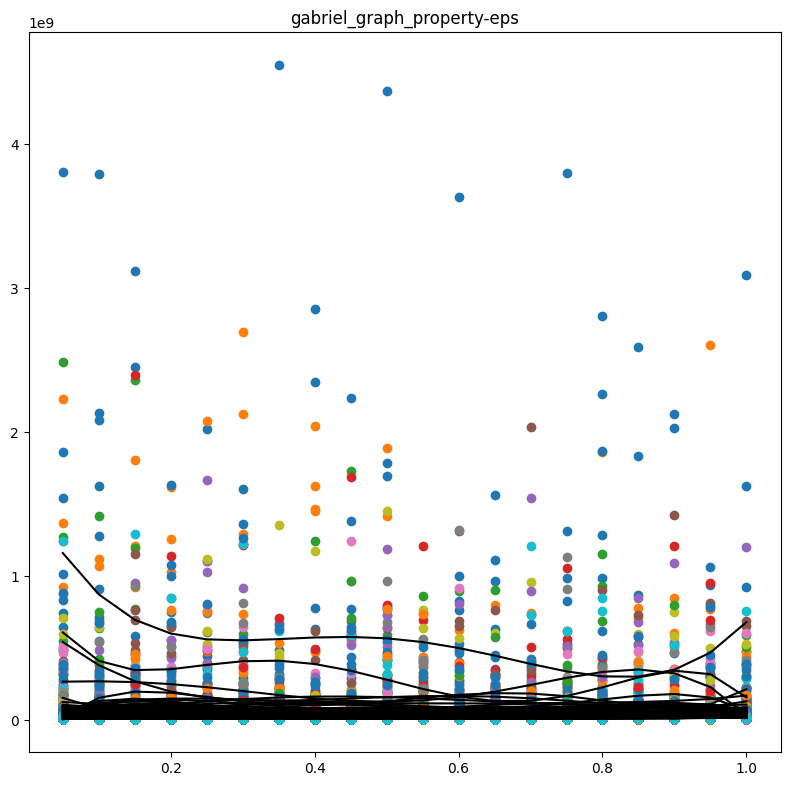

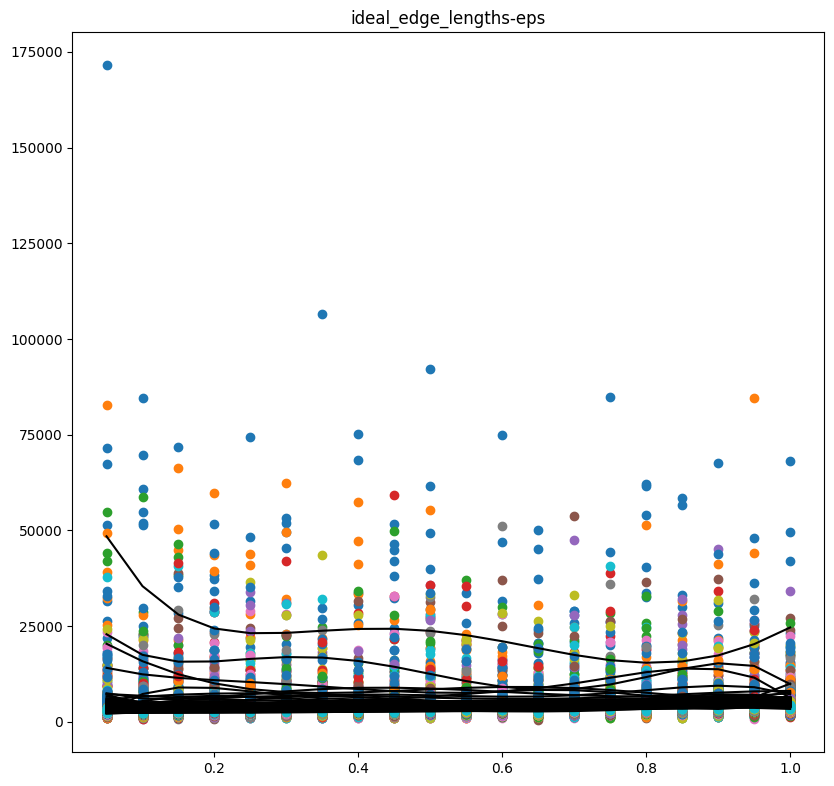

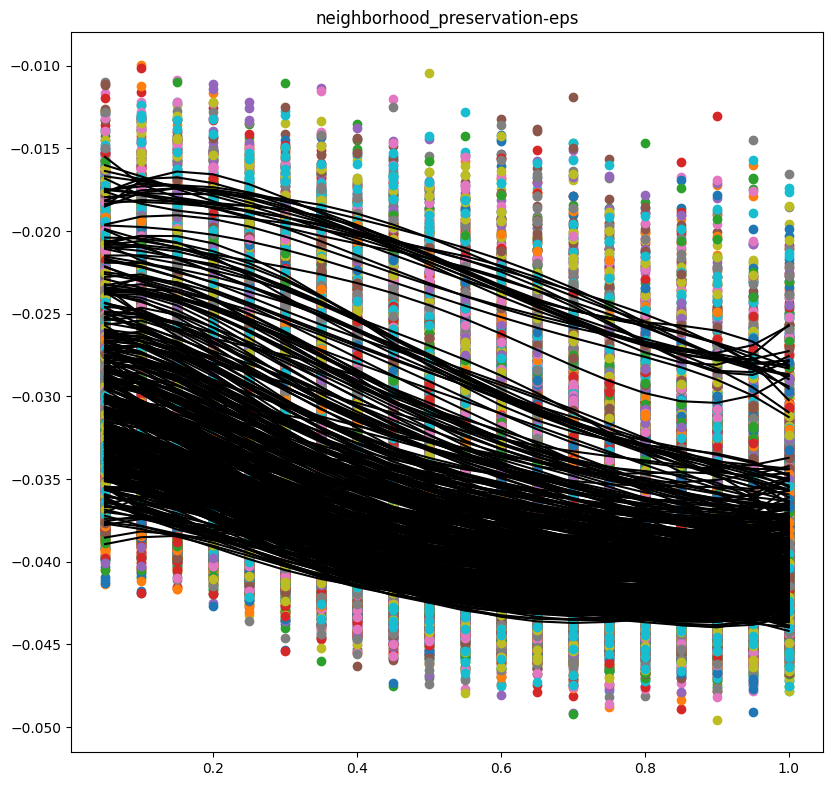

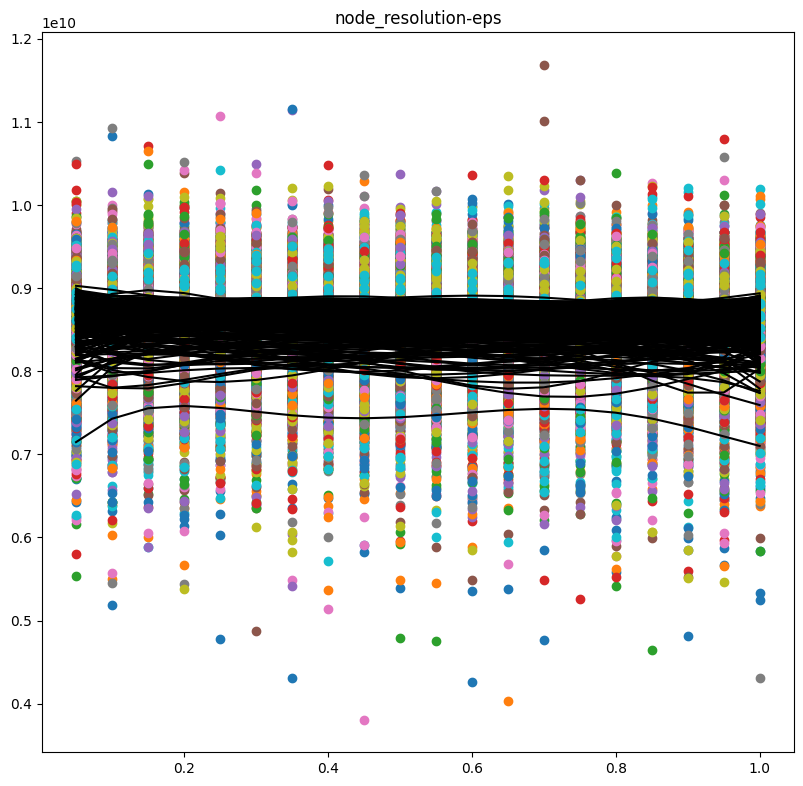

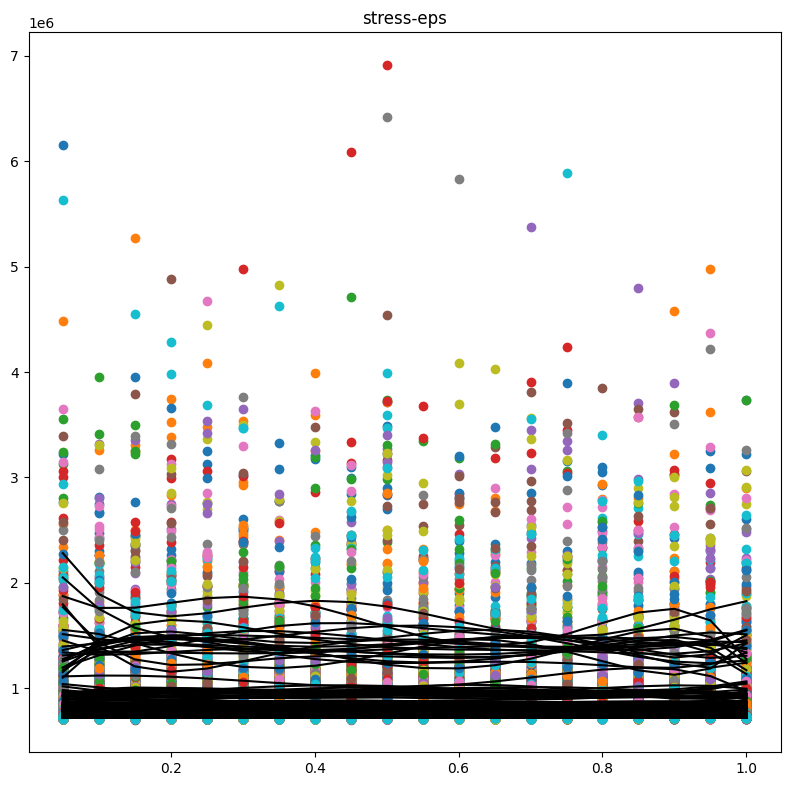

In [4]:
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
import matplotlib.pyplot as plt
from itertools import product
from sklearn.preprocessing import StandardScaler
import numpy as np


sscaler = StandardScaler()

deg = 5

for dataset_name in DATASET_NAMES:
    for params_name in PARAMS_NAMES:
        # params_name以外のパラメータの組み合わせ作成
        params_t = list(filter(lambda x: x != params_name, PARAMS_NAMES))
        comb = list(product(
            params_candidates[params_t[0]], params_candidates[params_t[1]]
        ))
        for qm_name in ALL_QM_NAMES:
            print(qm_name, params_t)
            fig, axis = plt.subplots(1, 1, figsize=(8, 8))
            fig.subplots_adjust(left=0.04, right=0.98, bottom=0.05, top=0.95)
            print(list(comb))
            for c in comb:
                df = data_df_dict[dataset_name]
                df = df.query(
                    " & ".join(
                        [
                            f"{item[1]} == {item[0]}"
                            for item in zip(c, params_t)
                        ]
                    )
                )
                x = df[params_name]
                y = df[qm_name]

                x = np.array(x).reshape(-1, 1)
                y = np.array(y).reshape(-1, 1)

                regr = Pipeline(
                    [
                        ("poly", PolynomialFeatures(degree=deg)),
                        ("linear", LinearRegression()),
                    ]
                )

                regr.fit(x, y)

                ux = np.unique(x).reshape(-1, 1)
                p_poly = regr.predict(ux)

                axis.scatter(x, y)
                axis.plot(ux, p_poly, color="black")
                axis.set_title(f"{qm_name}-{params_name}")
                # axis.set_title(
                #     f'{qm_name}-{"R^2={:.3f}".format(regr.score(x, y))}'
                # )
            plt.savefig(
                get_project_root_path()
                .joinpath("data")
                .joinpath("experiments")
                .joinpath("regression_analysis")
                .joinpath("params")
                .joinpath("images")
                .joinpath(f"{dataset_name}-{params_name}-{qm_name}.png")
            )


In [5]:
y

array([[718764.5   ],
       [720494.5625],
       [718419.25  ],
       [714305.3125],
       [731648.75  ],
       [741293.6875],
       [722177.375 ],
       [730503.75  ],
       [731648.125 ],
       [725034.3125],
       [734728.875 ],
       [717153.4375],
       [720872.875 ],
       [712887.875 ],
       [720609.75  ],
       [726548.8125],
       [732459.75  ],
       [732285.4375],
       [718582.1875],
       [728193.25  ],
       [721353.5   ],
       [758973.5   ],
       [722557.9375],
       [720697.    ],
       [724258.875 ],
       [725013.125 ],
       [747898.75  ],
       [720634.9375],
       [730769.5625],
       [716858.0625],
       [737058.    ],
       [712664.5625],
       [721743.8125],
       [709398.9375],
       [719800.375 ],
       [736640.4375],
       [733230.9375],
       [722344.125 ],
       [725945.8125],
       [717049.125 ],
       [713590.75  ],
       [718697.8125],
       [743004.875 ],
       [712081.5625],
       [716638.8125],
       [73

In [6]:
# from sklearn.preprocessing import PolynomialFeatures
# from sklearn.linear_model import LinearRegression
# from sklearn.pipeline import Pipeline
# import matplotlib.pyplot as plt


# deg = [5]
# image_path = (
#     EXPERIENT_DATA_DIR.joinpath("regression_analysis")
#     .joinpath("params")
#     .joinpath("images")
# )
# image_path.mkdir(parents=True, exist_ok=True)

# for dataset_name in DATASET_NAMES:
#     for params_name in PARAMS_NAMES:
#         for qm_name in ALL_QM_NAMES:
#             print(params_name, qm_name)
#             fig, axis = plt.subplots(1, 1, figsize=(8, 8))

#             for d in deg:
#                 regr = Pipeline(
#                     [
#                         ("poly", PolynomialFeatures(degree=d)),
#                         ("linear", LinearRegression()),
#                     ]
#                 )

#                 regr.fit(
#                     x[dataset_name][params_name],
#                     y[dataset_name][params_name][qm_name],
#                 )

#                 p_poly = regr.predict(x[dataset_name][params_name])

#                 axis.scatter(
#                     x[dataset_name][params_name],
#                     y[dataset_name][params_name][qm_name],
#                 )
#                 axis.plot(x[dataset_name][params_name], p_poly, color="black")
#                 axis.set_title(
#                     f'{qm_name}-{"R^2={:.3f}".format(regr.score(x[dataset_name][params_name], y[dataset_name][params_name][qm_name]))}'
#                 )
#             fig.subplots_adjust(left=0.04, right=0.98, bottom=0.05, top=0.95)
#             plt.savefig(
#                 image_path.joinpath(
#                     f"{dataset_name}-{params_name}-{qm_name}.png"
#                 )
#             )
#     break


In [7]:
from PIL import Image, ImageDraw, ImageFont


def get_concat_h(im1, im2):
    dst = Image.new("RGB", (im1.width + im2.width, im1.height), "black")
    dst.paste(im1, (0, 0))
    dst.paste(im2, (im1.width, 0))
    return dst


def get_concat_v(im1, im2):
    dst = Image.new("RGB", (im1.width, im1.height + im2.height))
    dst.paste(im1, (0, 0))
    dst.paste(im2, (0, im1.height))
    return dst


image_path = (
    get_project_root_path()
    .joinpath("data")
    .joinpath("experiments")
    .joinpath("regression_analysis")
    .joinpath("params")
    .joinpath("images")
)


for dataset_name in DATASET_NAMES:
    for params_name in PARAMS_NAMES:
        images = []
        tmp = []
        for qm_name in ALL_QM_NAMES:
            img_path = image_path.joinpath(f"{dataset_name}-{params_name}-{qm_name}.png")
            img = Image.open(img_path)

            tmp.append({"image": img})

            if len(tmp) == 3:
                images.append(tmp)
                tmp = []

        dst = None
        for v in images:
            h_dst = None
            for h in v:
                if h_dst is None:
                    h_dst = h["image"]
                    continue
                h_dst = get_concat_h(h_dst, h["image"])
            if dst is None:
                dst = h_dst
                continue
            dst = get_concat_v(dst, h_dst)
        draw = ImageDraw.Draw(dst)
        font = ImageFont.truetype("Arial.ttf", 36)
        draw.text((40, 40), f"{dataset_name}-{params_name}", "red", font=font)
        dst.save(image_path.joinpath(f"{dataset_name}-{params_name}.png"))



In [8]:
import os

for dataset_name in DATASET_NAMES:
    for params_name in PARAMS_NAMES:
        for qm_name in ALL_QM_NAMES:
            img_path = image_path.joinpath(f"{dataset_name}-{params_name}-{qm_name}.png")
            os.remove(img_path)

In [9]:
x

array([[0.05],
       [0.1 ],
       [0.15],
       [0.2 ],
       [0.25],
       [0.3 ],
       [0.35],
       [0.4 ],
       [0.45],
       [0.5 ],
       [0.55],
       [0.6 ],
       [0.65],
       [0.7 ],
       [0.75],
       [0.8 ],
       [0.85],
       [0.9 ],
       [0.95],
       [1.  ],
       [0.05],
       [0.1 ],
       [0.15],
       [0.2 ],
       [0.25],
       [0.3 ],
       [0.35],
       [0.4 ],
       [0.45],
       [0.5 ],
       [0.55],
       [0.6 ],
       [0.65],
       [0.7 ],
       [0.75],
       [0.8 ],
       [0.85],
       [0.9 ],
       [0.95],
       [1.  ],
       [0.05],
       [0.1 ],
       [0.15],
       [0.2 ],
       [0.25],
       [0.3 ],
       [0.35],
       [0.4 ],
       [0.45],
       [0.5 ],
       [0.55],
       [0.6 ],
       [0.65],
       [0.7 ],
       [0.75],
       [0.8 ],
       [0.85],
       [0.9 ],
       [0.95],
       [1.  ],
       [0.05],
       [0.1 ],
       [0.15],
       [0.2 ],
       [0.25],
       [0.3 ],
       [0.